# Image segmentation with U-Net and transfer learning
> Learn how to build a segmentation model based on the U-Net architecture and achieve good results thanks to transfer learning

- toc: true
- badges: true
- comments: true
- author: dzlab
- categories: [tensorflow, vision, segmentation]

In this article, we will implement a U-Net model (as depicted in the diagram below) and trained on a popular image segmentation dataset. Training a U-Net from scratch is a hard, so instead we will leverage transfer learning to get good result after only few epochs of training.

For reference, you can read the original U-Net paper [arxiv.org](https://arxiv.org/abs/1505.04597).

In [22]:
# Se connecter à Google Cloud dans Colab
from google.colab import auth
auth.authenticate_user()
print("Authenticated !")

Authenticated !


In [23]:
# Installer le SDK Google Cloud dans Colab
!pip install google-cloud-storage
!pip install matplotlib pillow    # installer les librairies nécessaires pour afficher et manipuler les images dans Colab.

In [24]:
from PIL import Image
from io import BytesIO    # Permet de lire une image directement depuis des bytes
import matplotlib.pyplot as plt
import random      # Pour choisir des images aléatoires

In [25]:
# Configurer l’accès au bucket Google Cloud Storage
from google.cloud import storage

bucket_name = "cityscapes_custom_2025"
client = storage.Client()
bucket = client.get_bucket(bucket_name)
print("✅ Bucket loaded:", bucket.name)


✅ Bucket loaded: cityscapes_custom_2025


## Lister les fichiers et créer le mapping image -> masque

In [26]:
# Préfixes des dossiers
rgb_prefix = "cityscapes-custom/"
mask_prefix = "cityscapes-custom/gtFine/"

# Lister tous les blobs
blobs = list(bucket.list_blobs(prefix="cityscapes-custom/"))

# Séparer images RGB et masques
rgb_images = [b.name for b in blobs if b.name.endswith("_leftImg8bit.png")]
mask_images = [b.name for b in blobs if b.name.endswith("_gtFine_labelIds.png")]

print("Nombre total d'images RGB :", len(rgb_images))
print("Nombre total de masques :", len(mask_images))






Nombre total d'images RGB : 5000
Nombre total de masques : 5000


In [27]:
# Afficher un exemple aléatoire pour toutes les villes
# Créer un dictionnaire image -> masque
image_to_mask = {}
for mask_path in mask_images:
    base_name = mask_path.split("/")[-1].replace("_gtFine_labelIds.png", "")
    parts = mask_path.split("/")
    split = parts[2]  # train / val / test
    city = parts[3]
    rgb_path = f"cityscapes-custom/{split}/{city}/{base_name}_leftImg8bit.png"
    if rgb_path in rgb_images:
        image_to_mask[rgb_path] = mask_path

print("Nombre total de paires RGB / masque :", len(image_to_mask))






Nombre total de paires RGB / masque : 5000


In [8]:
# Extraire toutes les villes présentes

cities = set()
for path in image_to_mask.keys():
    parts = path.split("/")
    city = parts[2]  # dans cityscapes-custom/<split>/<city>/...
    cities.add(city)
cities = sorted(list(cities))
print("Villes trouvées :", cities)





Villes trouvées : ['aachen', 'berlin', 'bielefeld', 'bochum', 'bonn', 'bremen', 'cologne', 'darmstadt', 'dusseldorf', 'erfurt', 'frankfurt', 'hamburg', 'hanover', 'jena', 'krefeld', 'leverkusen', 'lindau', 'mainz', 'monchengladbach', 'munich', 'munster', 'strasbourg', 'stuttgart', 'tubingen', 'ulm', 'weimar', 'zurich']


## Afficher un exemple image + masque

In [12]:
%matplotlib inline

In [16]:
# Fonction pour afficher image + masque

def show_image_and_mask(city):
    """
    Affiche une image RGB et son masque pour une ville donnée
    """
    # Filtrer les paires pour cette ville
    city_pairs = [(img, mask) for img, mask in image_to_mask.items() if f"/{city}/" in img]

    if not city_pairs:
        print(f"Aucune image ou masque trouvé pour {city}")
        return

    # Choisir une paire aléatoire
    img_path, mask_path = random.choice(city_pairs)

    # Télécharger et afficher
    img = Image.open(BytesIO(bucket.blob(img_path).download_as_bytes()))
    mask = Image.open(BytesIO(bucket.blob(mask_path).download_as_bytes()))

    fig, axes = plt.subplots(1, 2, figsize=(15, 8))
    axes[0].imshow(img)
    axes[0].set_title(f"Image RGB ({city})")
    axes[0].axis("off")

    axes[1].imshow(mask, cmap="tab20")
    axes[1].set_title(f"Masque LabelIds ({city})")
    axes[1].axis("off")

    plt.show()

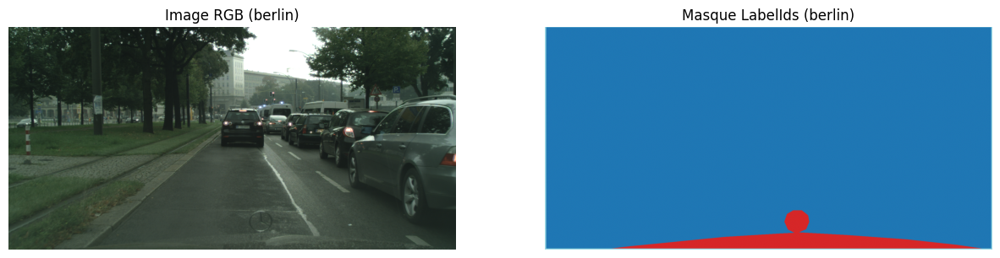

In [18]:
# Afficher un exemple pour Berlin (train)

show_image_and_mask("berlin")  # Affiche une image et son masque pour Berlin



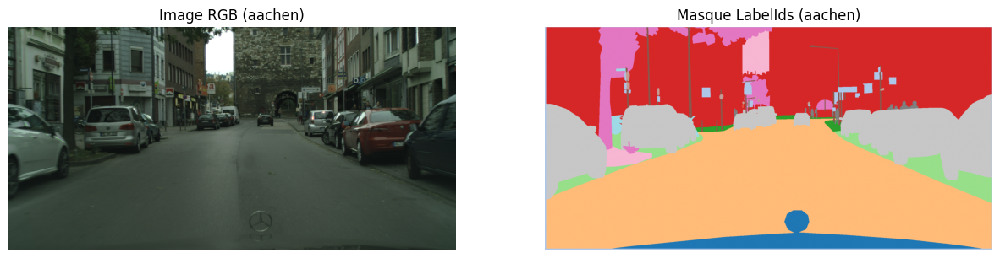

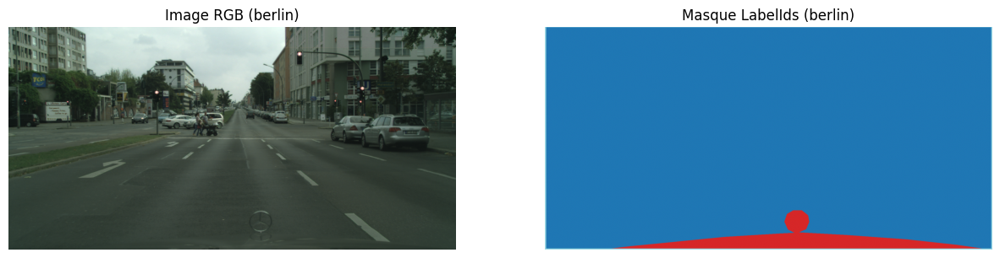

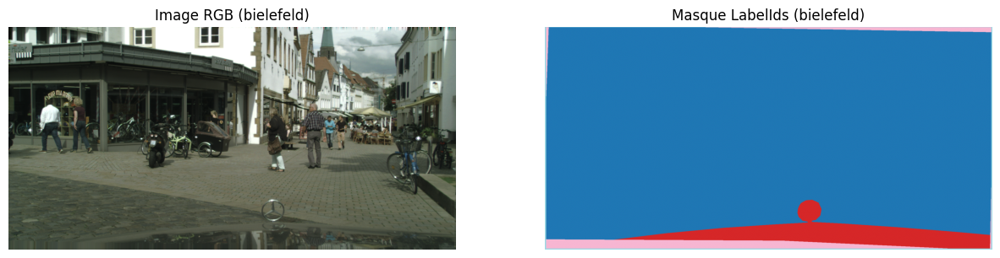

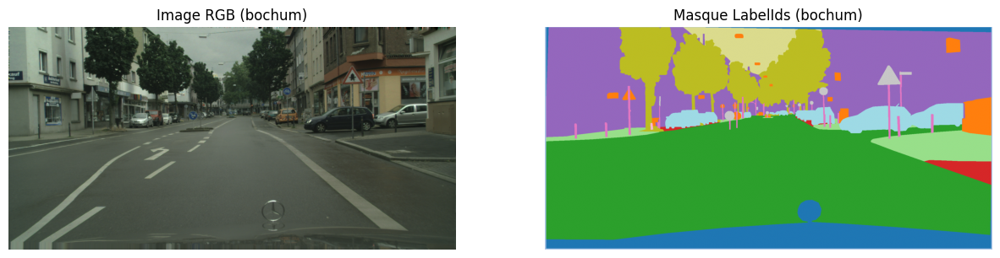

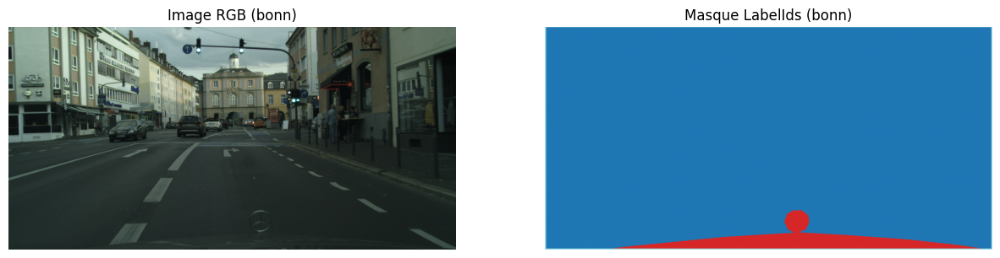

...

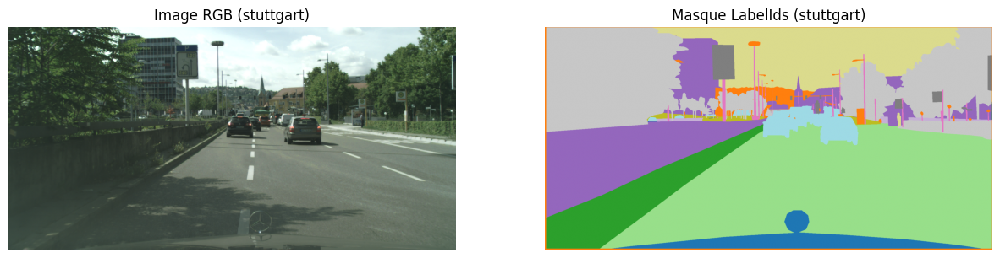

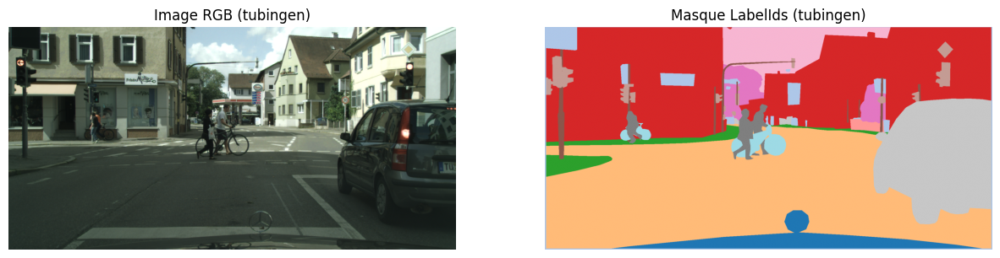

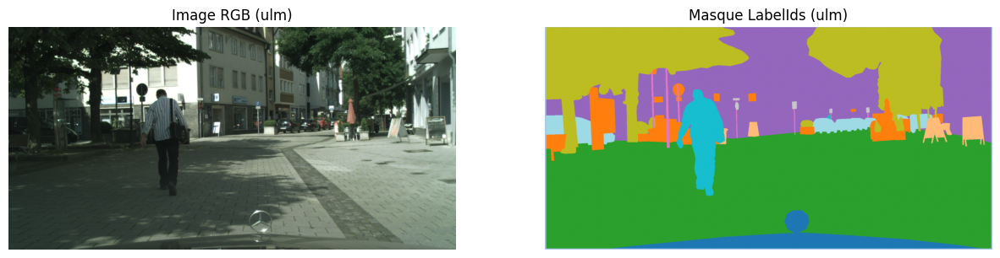

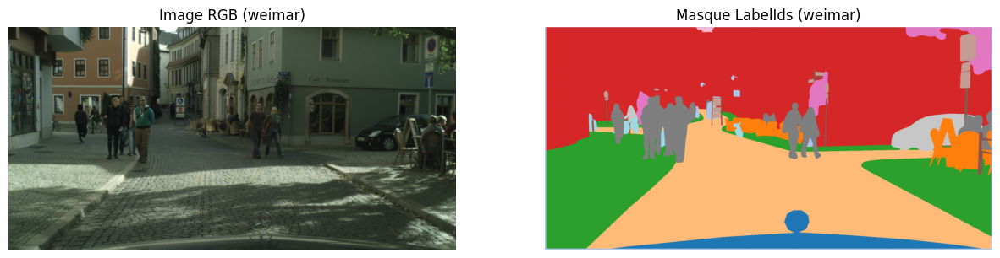

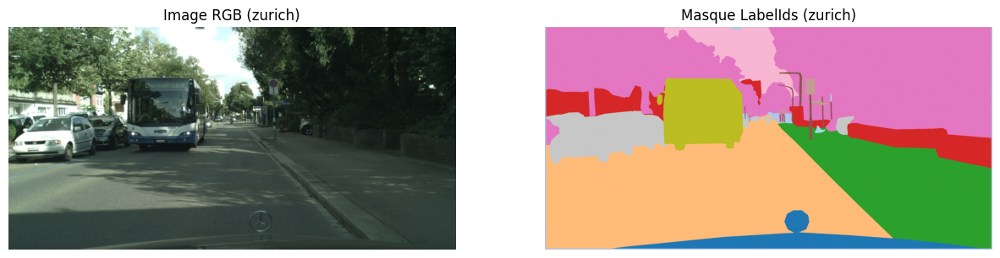

In [19]:
# Boucle sur toutes les villes
for city in cities:
    show_image_and_mask(city)

![u-net architecture](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png)

Before start, import the needed dependencies

In [5]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import *
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.models import *
from tensorflow.keras.optimizers import RMSprop
import os


## Data : Préparer les chemins et fonctions pour Cityscapes

Let's examine few images and the ground truth labels from the dataset

In [15]:
# DÉFINIR LES CHEMINS
!pip install --quiet tensorflow

import tensorflow as tf

IMG_HEIGHT = 256
IMG_WIDTH  = 256
NUM_CLASSES = 19

In [29]:
# Fonction pour lire une image depuis GCS
def read_image_from_gcs(img_path, mask_path):
    # img_path et mask_path sont des strings
    img = Image.open(BytesIO(bucket.blob(img_path.numpy().decode('utf-8')).download_as_bytes()))
    img = np.array(img.resize((IMG_WIDTH, IMG_HEIGHT))) / 255.0
    img = img.astype(np.float32)

    mask = Image.open(BytesIO(bucket.blob(mask_path.numpy().decode('utf-8')).download_as_bytes()))
    mask = np.array(mask.resize((IMG_WIDTH, IMG_HEIGHT), Image.NEAREST))
    mask = mask.astype(np.int32)

    return img, mask



In [31]:
# Fonction load_func compatible TF Dataset : plus besoin de passer bucket comme argument de tf.py_function.
def load_func(img_path, mask_path):
    img, mask = tf.py_function(func=read_image_from_gcs,
                               inp=[img_path, mask_path],
                               Tout=[tf.float32, tf.int32])
    img.set_shape([IMG_HEIGHT, IMG_WIDTH, 3])
    mask.set_shape([IMG_HEIGHT, IMG_WIDTH])
    return img, mask[..., tf.newaxis]


## Préparer le tf.data.Dataset

In [32]:
# Fonction pour créer le tf.data.Dataset à partir de image_to_mask
def make_dataset_from_gcs(image_to_mask, batch_size=8, shuffle=True):
    img_paths = list(image_to_mask.keys())
    mask_paths = list(image_to_mask.values())

    ds = tf.data.Dataset.from_tensor_slices((img_paths, mask_paths))
    ds = ds.map(load_func, num_parallel_calls=tf.data.AUTOTUNE)

    if shuffle:
        ds = ds.shuffle(100)

    ds = ds.batch(batch_size)
    ds = ds.prefetch(tf.data.AUTOTUNE)
    return ds



In [33]:
# Créer les datasets
train_dataset = make_dataset_from_gcs(image_to_mask, batch_size=8)
val_dataset   = make_dataset_from_gcs(image_to_mask, batch_size=8, shuffle=False)


## Model

## Définir l’Encoder (MobileNetV2)

As you can see in from the U-Net model architecture, the model consists of an Encoder depicted by a contracting path (left side) and a Decoder depicted by an expansive path (right side). From the left side, some skip connections are passed to the right side in order to improve the performance of the decoding.

Because the Encoder is very similar to a convolutional network, instead of creating this part and training it form scratch we will use a pretrained model and just select the output layers with appropriate shape to make skip connection to the Decoder. This way, we can train the model faster as we will have only the upsaming path to train.



In [35]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input

def create_down_path(input_size=(256, 256, 3)):
    """Encoder avec MobileNetV2 pré‑entrainé"""
    backbone = MobileNetV2(input_shape=input_size, include_top=False, weights='imagenet')
    # couches choisies pour les skip connections
    target_layers = [
        'block_1_expand_relu',
        'block_3_expand_relu',
        'block_6_expand_relu',
        'block_13_expand_relu',
        'block_16_project'
    ]
    layers = [backbone.get_layer(l).output for l in target_layers]
    encoder = Model(inputs=backbone.input, outputs=layers)
    encoder.trainable = False  # geler le backbone
    return encoder


# À changer : si on veut un autre backbone (ex : ResNet), changer MobileNetV2 et les couches cibles.

First, let's define a function that creates the Encoder. We will use a pretrained [MobileNetV2](https://www.tensorflow.org/api_docs/python/tf/keras/applications/mobilenet_v2/MobileNetV2) on ImageNet as backbone for the Encoder. The output of the Encoder consits of few cherry picked layers that we will use later to create the skip connection from this Encoder to the Decoder part of the model.

> Note: with `model.trainable = False` we are freezing the weights of the Encoder as we don't want to train it as it all the used layers were already trained on ImageNet.

Second, we define a function that creates the up-sampling path which consists of a sequence of blocks that uses the [Conv2DTranspose](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2DTranspose) layer.

## Définir le Decoder (upsampling)

In [36]:
from tensorflow.keras.layers import Conv2DTranspose, BatchNormalization, ReLU, Dropout
from tensorflow.keras import Sequential
import tensorflow as tf

def create_up_path(size=4, dropout=False):
    """Decoder avec blocs Conv2DTranspose"""
    decoder = []
    init = tf.random_normal_initializer(0.0, 0.02)
    for filters in (512, 256, 128, 64):
        block = Sequential()
        block.add(Conv2DTranspose(filters=filters, kernel_size=size, strides=2,
                                  padding='same', kernel_initializer=init, use_bias=False))
        block.add(BatchNormalization())
        if dropout:
            block.add(Dropout(rate=0.5))
        block.add(ReLU())
        decoder.append(block)
    return decoder


Finally, we use the previous functions to create the Encoder and Decoder components, and wire them with the skip connections.

## Assembler l’U‑Net

In [37]:
from tensorflow.keras.layers import Concatenate

def create_unet(input_size=(256, 256, 3), num_classes=NUM_CLASSES):
    down_stack = create_down_path(input_size)
    up_stack = create_up_path()

    inputs = Input(shape=input_size)
    x = inputs
    skip_layers = down_stack(x)
    x = skip_layers[-1]
    skip_layers = reversed(skip_layers[:-1])

    for up, skip_connection in zip(up_stack, skip_layers):
        x = up(x)
        x = Concatenate()([x, skip_connection])

    # sortie avec autant de classes que Cityscapes
    init = tf.random_normal_initializer(0.0, 0.02)
    output = Conv2DTranspose(filters=num_classes, kernel_size=3, strides=2, padding='same',
                             kernel_initializer=init)(x)

    return Model(inputs=inputs, outputs=output)

# Créer le modèle
unet_model = create_unet()
unet_model.summary()

# À changer : filters=num_classes pour correspondre au dataset.


/tmp/ipython-input-4266997013.py:7: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  backbone = MobileNetV2(input_shape=input_size, include_top=False, weights='imagenet')


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional          │ [(None, 128, 128, │  1,841,984 │ input_layer_1[0]… │
│ (Functional)        │ 96), (None, 64,   │            │                   │
│                     │ 64, 144), (None,  │            │                   │
│                     │ 32, 32, 192),     │            │                   │
│                     │ (None, 16, 16,    │            │                   │
│                     │ 576), (None, 8,   │            │                   │
│                     │ 8, 320)]          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 16, 16,    │  2,623,488 │ functional[0][4]  │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 16, 16,    │          0 │ sequential[0][0], │
│ (Concatenate)       │ 1088)             │            │ functional[0][3]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 32, 32,    │  4,457,472 │ concatenate[0][0] │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 32, 32,    │          0 │ sequential_1[0][… │
│ (Concatenate)       │ 448)              │            │ functional[0][2]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 64, 64,    │    918,016 │ concatenate_1[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 64, 64,    │          0 │ sequential_2[0][… │
│ (Concatenate)       │ 272)              │            │ functional[0][1]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 128, 128,  │    278,784 │ concatenate_2[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 128, 128,  │          0 │ sequential_3[0][… │
│ (Concatenate)       │ 160)              │            │ functional[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_4  │ (None, 256, 256,  │     27,379 │ concatenate_3[0]… │
│ (Conv2DTranspose)   │ 19)               │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 10,147,123 (38.71 MB)

 Trainable params: 8,303,219 (31.67 MB)

 Non-trainable params: 1,843,904 (7.03 MB)

> Note: The intput of the U-Net model has same dimension as the input image, and as many channels as the number of segmentation classes (because each pixel can be categorized into one of 3 classes)

Now we can create the model and inspect it, notice how the output layers from the Encoder are used by the different blocks of the decoder.

## Compiler le modèle

In [38]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import SparseCategoricalCrossentropy

unet_model.compile(
    optimizer=RMSprop(),
    loss=SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)


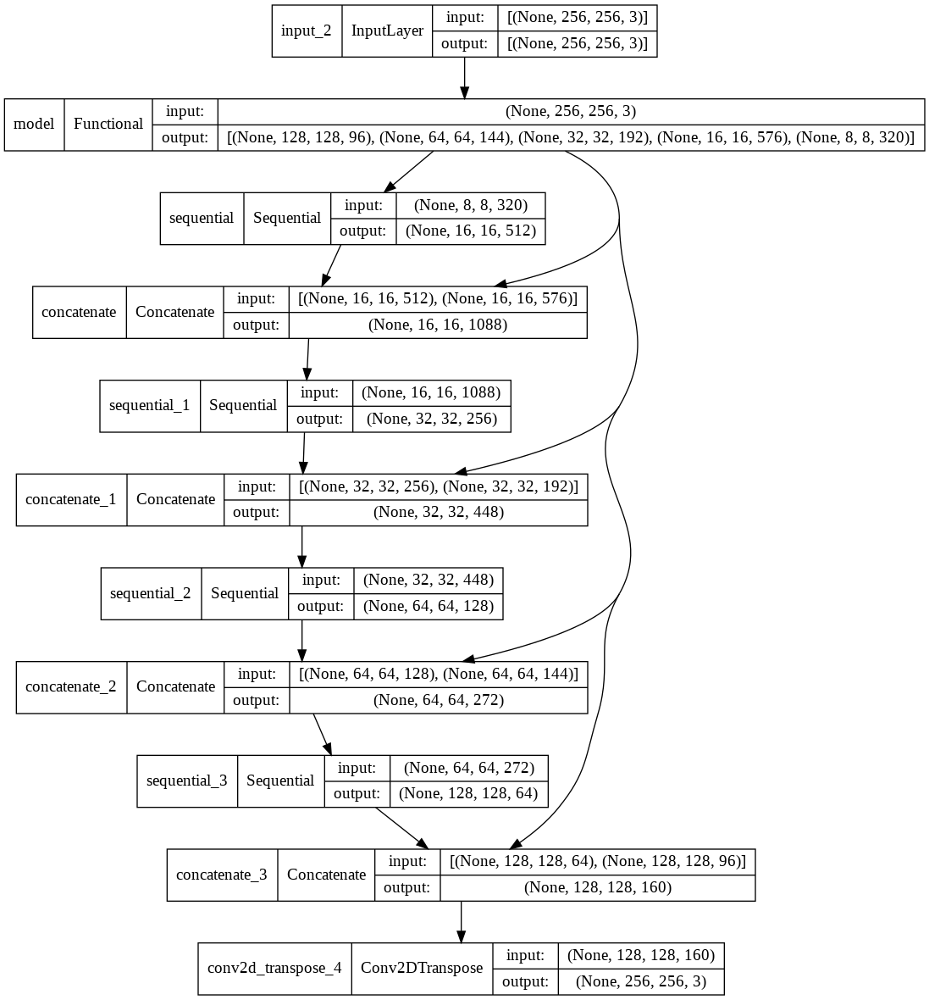

In [ ]:
tf.keras.utils.plot_model(unet_model, show_shapes=True)

Let's compile the model to get ready for training. We will use RMSProp as optimizer and SparseCategoricalCrossentropy as the loss function.

## Training

## Préparer la fonction d’augmentation / normalisation

We need to normalize the images so they match the expected input of the pretrained MobileNetV2 model

In [39]:
def normalize(input_image, input_mask):
    input_image = tf.cast(input_image, tf.float32) / 255.0
    return input_image, input_mask

Let's define a function that will be used by the TF Dataset to load images and their labels, normalize the images and perform some basic augmentation (flip the image and mask) only for training.

In [41]:
@tf.function
def augment_image(img, mask):
    """Flip horizontal aléatoire pour l’entrainement"""
    if tf.random.uniform(()) > 0.5:
        img = tf.image.flip_left_right(img)
        mask = tf.image.flip_left_right(mask)
    return img, mask

# À changer : ajouter rotation, crop, blur, etc. pour augmenter le dataset.

Now we can start the training of our U-Net model

## Paramètres d’entraînement et fit

In [42]:
# Définition des paramètres de training
EPOCHS = 10
BATCH_SIZE = 8  # déjà défini dans make_dataset_from_gcs


In [ ]:
# Lancer l'entraînement
hist = unet_model.fit(
    train_dataset,       # ton dataset d'entraînement préparé depuis GCS
    validation_data=val_dataset,  # dataset de validation
    epochs=EPOCHS
)


Epoch 1/10
132/625 ━━━━━━━━━━━━━━━━━━━━ 55:22 7s/step - accuracy: 0.9263 - loss: 0.3434

> MobileNets have many different input size configurations 128, 160, 192 and 224, in our case we are sizing the images into 256 which is not supported hence the warnings in the output. Thre is nothing to worry about the model is trained properly and validation is performed.

Now we can examine the losses and accuracy progress per epoch

## Visualiser la perte et l’accuracy :

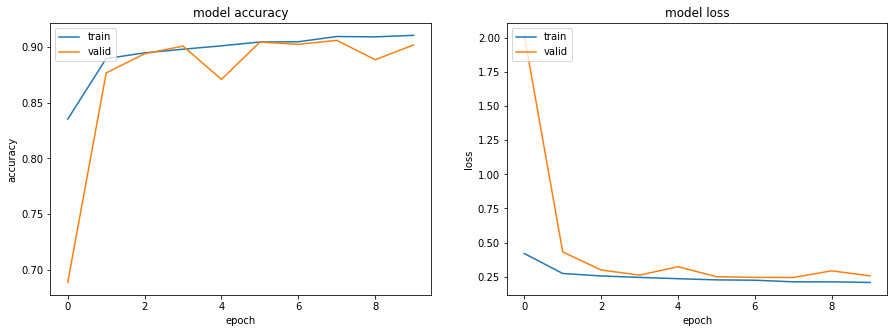

In [ ]:
import matplotlib.pyplot as plt

fig, axis = plt.subplots(1, 2, figsize=(15, 5))

# Accuracy
axis[0].plot(hist.history['accuracy'])
axis[0].plot(hist.history['val_accuracy'])
axis[0].set_title('Model Accuracy')
axis[0].set_ylabel('Accuracy')
axis[0].set_xlabel('Epoch')
axis[0].legend(['train', 'valid'], loc='upper left')

# Loss
axis[1].plot(hist.history['loss'])
axis[1].plot(hist.history['val_loss'])
axis[1].set_title('Model Loss')
axis[1].set_ylabel('Loss')
axis[1].set_xlabel('Epoch')
axis[1].legend(['train', 'valid'], loc='upper left')

plt.show()


## Evaluation

We can evaluate our U-Net model on the entire test dataset simply as follows

In [ ]:
# Évaluation finale sur le dataset de validation
result = unet_model.evaluate(val_dataset)

58/58 [==============================] - 16s 277ms/step - loss: 0.2512 - accuracy: 0.9024
Accuracy: 90.24%


In [ ]:
print(f'Test Accuracy: {result[1] * 100:.2f}%')

Test Accuracy: 90.24%


For a visual examination and an inspection of the precited segmentation, we need some helper function to transform the output of the trained U-Net model into an actual valid mask, hence the following functions

## Générer et afficher les prédictions

In [ ]:
# Helper functions pour transformer les sorties du modèle en masques affichables
import cv2
import tensorflow as tf

def create_mask(pred_mask):
    """
    Convertit la sortie du modèle (logits) en masque prédictif.
    """
    pred_mask = tf.argmax(pred_mask, axis=-1)
    return pred_mask[..., tf.newaxis]

def process_mask(mask):
    """
    Convertit un masque en image uint8 RGB pour affichage.
    """
    mask = (mask.numpy() * 127.5).astype('uint8')
    mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)
    return mask


From the test dataset we take sample images and pass them through the U-Net model to generate predictions that later we will compare against the ground truth masks.

In [ ]:
# Fonction pour générer les prédictions sur un échantillon du dataset
from tqdm import tqdm

def generate_predictions(model, dataset, sample_size=5):
    """
    Prend un dataset et génère les masques prédits.
    Retourne une liste de tuples (image, masque_ground_truth, masque_prédit).
    """
    output = []
    for image, mask in tqdm(dataset.take(sample_size)):
        pred_mask = model.predict(image)
        pred_mask = process_mask(create_mask(pred_mask))

        # Normaliser l'image pour l'affichage
        image_disp = (image[0].numpy() * 255).astype('uint8')
        mask_disp = process_mask(mask[0])

        output.append((image_disp, mask_disp, pred_mask))
    return output


The following helper function will be used to plot a set of predictions

In [ ]:
# Fonction pour afficher les images, masques ground truth et prédits
import matplotlib.pyplot as plt

def plot_predictions(predictions):
    """
    Affiche les images, les masques ground truth et les masques prédits.
    """
    fig, axis = plt.subplots(len(predictions), 3, figsize=(12, 4*len(predictions)))

    for i, (image, mask_gt, mask_pred) in enumerate(predictions):
        axis[i, 0].imshow(image)
        axis[i, 0].set_title("Image")
        axis[i, 0].axis('off')

        axis[i, 1].imshow(mask_gt)
        axis[i, 1].set_title("Ground Truth")
        axis[i, 1].axis('off')

        axis[i, 2].imshow(mask_pred)
        axis[i, 2].set_title("Predicted")
        axis[i, 2].axis('off')

    plt.tight_layout()
    plt.show()


Now we can generate predicted masks for a sample of the images in the test set and plot them for inspection

In [ ]:
# Exemple d’utilisation avec mon dataset GCS
predictions = generate_predictions(unet_model, val_dataset, sample_size=5)
plot_predictions(predictions)


100%|██████████| 5/5 [00:03<00:00,  1.33it/s]


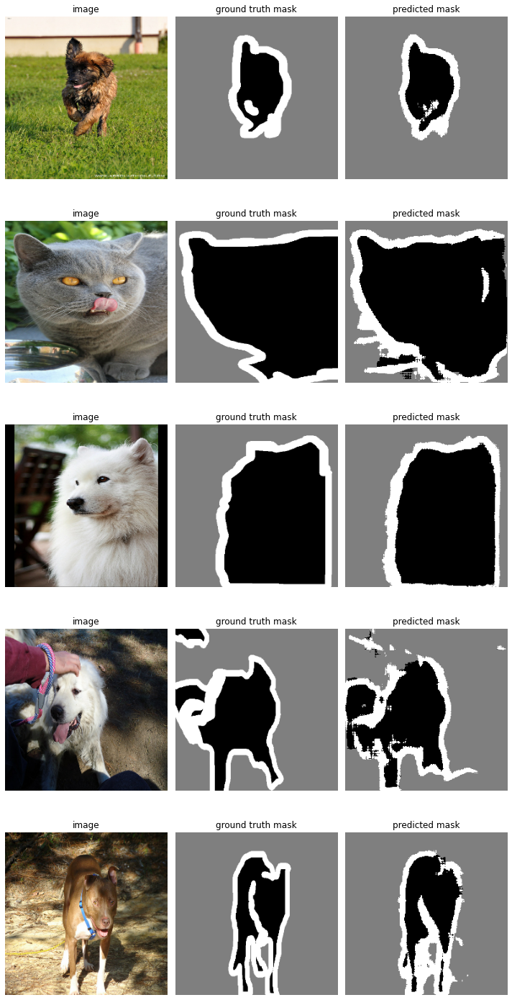

In [ ]:
plot_predictions(predictions)

As you can see from the predicted masks, the model was able to do a good job even if it was trained on very few epochs. It did very well on the easy example but could not do a good job in the harder exmaples. For instance on darker images or when the image contains more than just a pet.

I put lot efforts in writting every article, I hope you found this one useful as well as easy to digest.

Feel free to leave a comment or reach out on twitter [@bachiirc](https://twitter.com/bachiirc)
